In [1]:
import pandas as pd
import csv
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
pip install geopandas

Note: you may need to restart the kernel to use updated packages.


In [3]:
import geopandas as gpd

In [4]:
pip install networkx

Note: you may need to restart the kernel to use updated packages.


In [29]:
pip install Ipython

Note: you may need to restart the kernel to use updated packages.


In [30]:
pip install pyvis

Note: you may need to restart the kernel to use updated packages.


In [283]:
pip install statsmodels

Note: you may need to restart the kernel to use updated packages.


In [386]:
pip install "holoviews[recommended]"

Note: you may need to restart the kernel to use updated packages.


In [284]:
import statsmodels.api as sm

In [5]:
import networkx as nx


In [31]:
from pyvis.network import Network

In [32]:
from IPython.display import HTML

In [6]:
secondwave = pd.read_csv('secondwave_casedata.csv')

In [7]:
secondwave

,Unnamed: 0,areaName,date,newCasesBySpecimenDate,All ages,"New Cases per 100,000 People",Region
0,10725,Redcar and Cleveland,2021-03-31,10,137150.0,7.291287,North East
1,10726,East Devon,2021-03-31,0,146284.0,0.000000,South West
2,10727,Havant,2021-03-31,4,126220.0,3.169070,South East
3,10728,Surrey Heath,2021-03-31,2,89305.0,2.239516,South East
4,10729,Worthing,2021-03-31,6,110570.0,5.426427,South East
...,...,...,...,...,...,...,...
66775,381614,Colchester,2020-09-01,1,194706.0,0.513595,East of England
66776,381615,Basingstoke and Deane,2020-09-01,4,176582.0,2.265237,South East
66777,381616,Tunbridge Wells,2020-09-01,3,118724.0,2.526869,South East
66778,381617,Rushcliffe,2020-09-01,5,119184.0,4.195194,East Midlands


In [9]:
case_corrs = pd.read_csv('Second_Wave_Corrs.csv')

In [10]:
r_corrs = pd.read_csv('Second_Wave_R.csv')

In [1]:
ltla_dist = pd.read_csv('centroid_distances2.csv')

NameError: name 'pd' is not defined

In [236]:
r_corrs

,LTLA 1,LTLA 2,Maximum Correlation,Lag in Days
0,Redcar and Cleveland,East Devon,0.510294,2.0
1,Redcar and Cleveland,Havant,0.513457,1.0
2,Redcar and Cleveland,Surrey Heath,0.556980,0.0
3,Redcar and Cleveland,Worthing,0.369575,0.0
4,Redcar and Cleveland,Bolton,0.681294,2.0
...,...,...,...,...
49450,Basingstoke and Deane,Rushcliffe,0.586482,-3.0
49451,Basingstoke and Deane,Hillingdon,0.785477,-9.0
49452,Tunbridge Wells,Rushcliffe,0.376819,2.0
49453,Tunbridge Wells,Hillingdon,0.583710,-2.0


In [290]:
map_df = gpd.read_file('LAD_APR_2019_UK_BUC.shp')

In [291]:
keep = ["E"]
map_df = map_df[map_df['LAD19CD'].str.contains('|'.join(keep))]
map_df

,LAD19CD,LAD19NM,LAD19NMW,BNG_E,BNG_N,LONG,LAT,GlobalID,geometry
0,E06000001,Hartlepool,NaN,447157,531476,-1.27023,54.6762,04419154-a30d-4803-ad36-adff535bdc4f,"POLYGON ((453098.301 534104.204, 453343.303 53..."
1,E06000002,Middlesbrough,NaN,451141,516887,-1.21099,54.5447,8c58c819-b053-440b-a820-4f325831bae7,"POLYGON ((446483.900 519130.144, 447775.604 51..."
2,E06000003,Redcar and Cleveland,NaN,464359,519597,-1.00611,54.5675,a28340e3-933d-4e5f-b0bb-db0141fd39f5,"POLYGON ((455049.503 524684.000, 454677.099 52..."
3,E06000004,Stockton-on-Tees,NaN,444937,518183,-1.30669,54.5569,45846d1d-0ddc-478c-9709-46a63608934f,"POLYGON ((446483.900 519130.144, 447271.401 51..."
4,E06000005,Darlington,NaN,428029,515648,-1.56835,54.5353,073fde2a-793d-488d-8028-641cc746e271,"POLYGON ((419709.299 515678.298, 419162.998 51..."
...,...,...,...,...,...,...,...,...,...
312,E09000029,Sutton,NaN,527356,163640,-0.17227,51.3576,6837438e-5a87-4614-9a8a-99cdb7b6bfa0,"POLYGON ((522578.499 167053.601, 524104.000 16..."
313,E09000030,Tower Hamlets,NaN,536345,181451,-0.03640,51.5155,db3d3b42-aab6-4a55-bd76-1b03ce4b2b4e,"POLYGON ((539209.254 180727.265, 538506.172 18..."
314,E09000031,Waltham Forest,NaN,537327,190277,-0.01881,51.5946,d549bb9f-d79a-46af-b840-6a12883f055b,"POLYGON ((537625.101 196029.497, 540060.799 19..."
315,E09000032,Wandsworth,NaN,525152,174137,-0.20021,51.4524,ae8b0119-ba95-4f3a-bf05-112793bf65c4,"POLYGON ((528519.296 175722.099, 529115.703 17..."


In [292]:
map_df['Centroid'] = map_df['geometry'].centroid

In [15]:
maxcorrs_region = pd.read_csv('secondwave_maxcorrs_wregion.csv')

In [18]:
ltla2region = pd.read_csv('ltla2region.csv')

In [293]:
map_df = map_df.set_index('LAD19NM')
map_df = map_df.rename(index={'Cornwall and Isles of Scilly': 'Cornwall'})


In [294]:
map_df = map_df.reset_index()


In [139]:
nodes = []
for idx, row in ltla2region.iterrows():
    nodes.append((row["LAD19NM"], {"color": row.Colour, "region": row.RGN19NM}))
nodes[:1]

[('City of London', {'color': 'red', 'region': 'London'})]

In [140]:
G = nx.Graph()
G.add_nodes_from(nodes)

In [141]:
maxcorrs_region = maxcorrs_region.replace(np.nan, 'purple')

In [142]:
edge_list = []
for idx, row in maxcorrs_region.iterrows():
    edge_list.append((row['LTLA 1'], row['LTLA 2']))
edge_list[:1]

[('Redcar and Cleveland', 'Middlesbrough')]

In [143]:
G.add_edges_from(edge_list)

In [33]:
net = Network(notebook=True)
net.from_nx(G)
net.save_graph("secondwave_network.html")

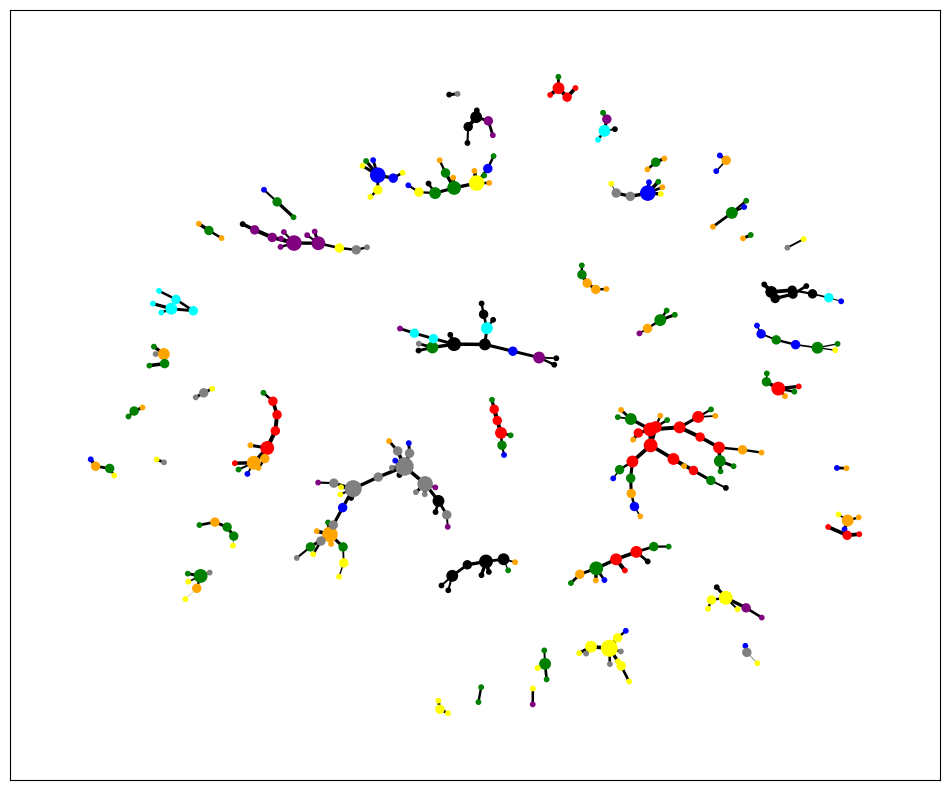

In [232]:
G = nx.from_pandas_edgelist(maxcorrs_region,'LTLA 1','LTLA 2', edge_attr='Maximum Correlation')
correlations = [i['Maximum Correlation'] for i in dict(G.edges).values()]
#distance = [i['Distance between centroids'] for i in dict(G.edges).values()]
labels = [i for i in dict(G.nodes).keys()]
labels = {i:i for i in dict(G.nodes).keys()}

d = G.degree()
degree_values = [v for k, v in d]
deg_vals = [x * 25 for x in degree_values]

def normalize2(values, bounds):
    return [bounds['desired']['lower'] + (x - bounds['actual']['lower']) * (bounds['desired']['upper'] - bounds['desired']['lower']) / (bounds['actual']['upper'] - bounds['actual']['lower']) for x in values]
size_new = normalize2(degree_values,{'actual':{'lower':1,'upper':7},'desired':{'lower':10,'upper':150}})

def normalize(values, bounds):
    return [bounds['desired']['lower'] + (x - bounds['actual']['lower']) * (bounds['desired']['upper'] - bounds['desired']['lower']) / (bounds['actual']['upper'] - bounds['actual']['lower']) for x in values]
corrs_new = normalize(correlations,{'actual':{'lower':0.69,'upper':0.96},'desired':{'lower':0.1,'upper':3}})
#carac = pd.DataFrame({ 'Region':['North East', 'North West', 'West Midlands','East Midlands','East of England', 'South East', 'London', 'South West'], 'myvalue':['group1','group2','group3','group4','group5', 'group6', 'group7', 'group8'] })
#swr_max_corrs['Region 1']=pd.Categorical(swr_max_corrs['Region 1'])
#swr_max_corrs['Region 1'].cat.codes

fig, ax = plt.subplots(figsize=(12,10))
pos = nx.spring_layout(G, seed=7)
nx.draw_networkx_nodes(G, pos, ax = ax, node_size = size_new, node_color = colours2, label=True)
nx.draw_networkx_edges(G, pos, width=corrs_new, ax=ax)
#nx.draw_networkx_labels(G, pos, labels, font_size = 6, ax=ax)
plt.show()

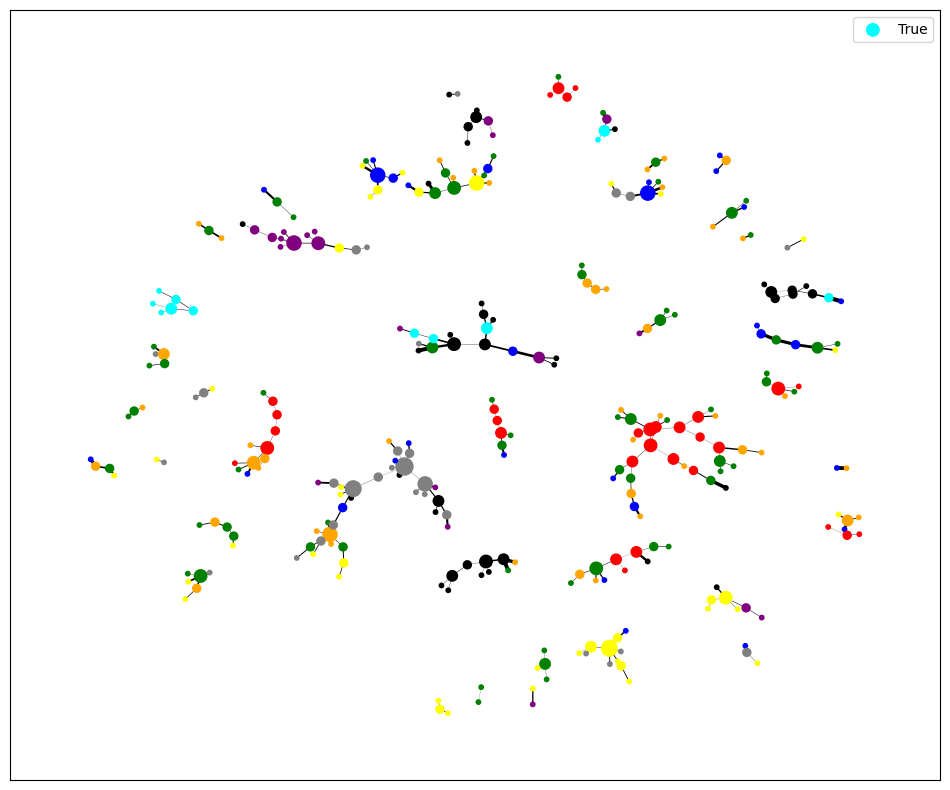

In [247]:
G = nx.from_pandas_edgelist(maxcorrs_region,'LTLA 1','LTLA 2', edge_attr='Distance between centroids')
distance = [i['Distance between centroids'] for i in dict(G.edges).values()]
#distance = [i['Distance between centroids'] for i in dict(G.edges).values()]
labels = [i for i in dict(G.nodes).keys()]
labels = {i:i for i in dict(G.nodes).keys()}

d = G.degree()
degree_values = [v for k, v in d]
deg_vals = [x * 25 for x in degree_values]

def normalize2(values, bounds):
    return [bounds['desired']['lower'] + (x - bounds['actual']['lower']) * (bounds['desired']['upper'] - bounds['desired']['lower']) / (bounds['actual']['upper'] - bounds['actual']['lower']) for x in values]
size_new = normalize2(degree_values,{'actual':{'lower':1,'upper':7},'desired':{'lower':10,'upper':150}})

def normalize(values, bounds):
    return [bounds['desired']['lower'] + (x - bounds['actual']['lower']) * (bounds['desired']['upper'] - bounds['desired']['lower']) / (bounds['actual']['upper'] - bounds['actual']['lower']) for x in values]
distance_new = normalize(distance,{'actual':{'lower':4,'upper':493},'desired':{'lower':0.1,'upper':3}})
#carac = pd.DataFrame({ 'Region':['North East', 'North West', 'West Midlands','East Midlands','East of England', 'South East', 'London', 'South West'], 'myvalue':['group1','group2','group3','group4','group5', 'group6', 'group7', 'group8'] })
#swr_max_corrs['Region 1']=pd.Categorical(swr_max_corrs['Region 1'])
#swr_max_corrs['Region 1'].cat.codes

fig, ax = plt.subplots(figsize=(12,10))
pos = nx.spring_layout(G, seed=7)
nx.draw_networkx_nodes(G, pos, ax = ax, node_size = size_new, node_color = colours2, label=True)
nx.draw_networkx_edges(G, pos, width=distance_new, ax=ax)
#nx.draw_networkx_labels(G, pos, labels, font_size = 6, ax=ax)
ax.legend()
plt.show()

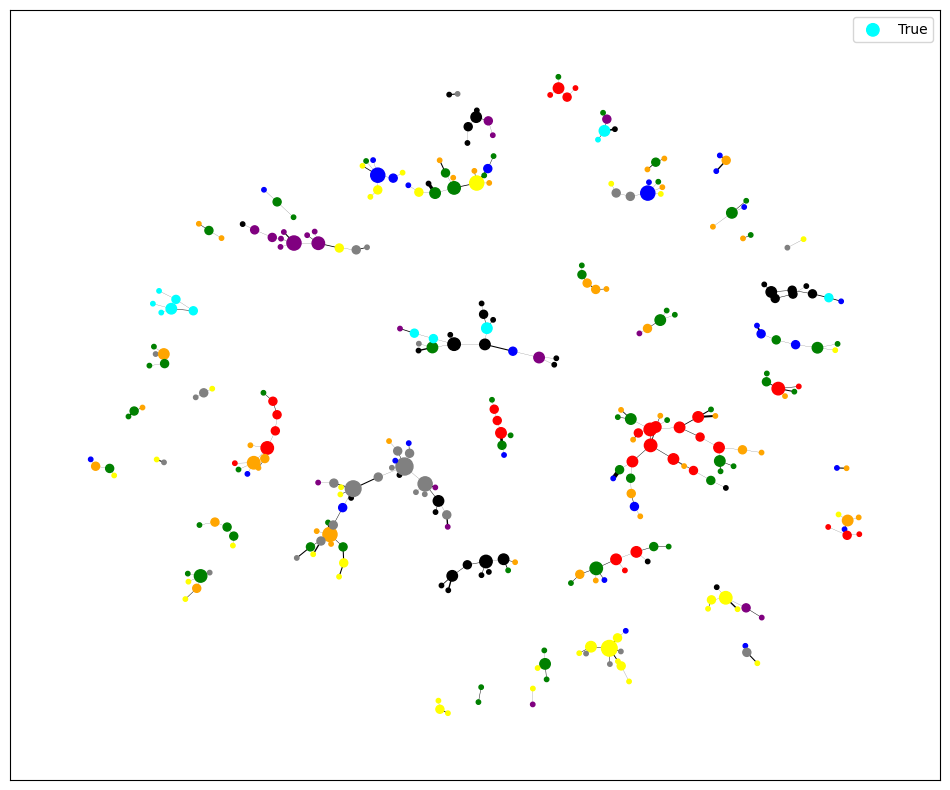

In [248]:
G = nx.from_pandas_edgelist(maxcorrs_region,'LTLA 1','LTLA 2', edge_attr='Lag in Days')
lag = [i['Lag in Days'] for i in dict(G.edges).values()]
#distance = [i['Distance between centroids'] for i in dict(G.edges).values()]
labels = [i for i in dict(G.nodes).keys()]
labels = {i:i for i in dict(G.nodes).keys()}

d = G.degree()
degree_values = [v for k, v in d]
deg_vals = [x * 25 for x in degree_values]

def normalize2(values, bounds):
    return [bounds['desired']['lower'] + (x - bounds['actual']['lower']) * (bounds['desired']['upper'] - bounds['desired']['lower']) / (bounds['actual']['upper'] - bounds['actual']['lower']) for x in values]
size_new = normalize2(degree_values,{'actual':{'lower':1,'upper':7},'desired':{'lower':10,'upper':150}})

def normalize(values, bounds):
    return [bounds['desired']['lower'] + (x - bounds['actual']['lower']) * (bounds['desired']['upper'] - bounds['desired']['lower']) / (bounds['actual']['upper'] - bounds['actual']['lower']) for x in values]
lag_new= normalize(lag,{'actual':{'lower':0,'upper':13},'desired':{'lower':0.1,'upper':3}})
#carac = pd.DataFrame({ 'Region':['North East', 'North West', 'West Midlands','East Midlands','East of England', 'South East', 'London', 'South West'], 'myvalue':['group1','group2','group3','group4','group5', 'group6', 'group7', 'group8'] })
#swr_max_corrs['Region 1']=pd.Categorical(swr_max_corrs['Region 1'])
#swr_max_corrs['Region 1'].cat.codes

fig, ax = plt.subplots(figsize=(12,10))
pos = nx.spring_layout(G, seed=7)
nx.draw_networkx_nodes(G, pos, ax = ax, node_size = size_new, node_color = colours2, label=True)
nx.draw_networkx_edges(G, pos, width=lag_new, ax=ax)
#nx.draw_networkx_labels(G, pos, labels, font_size = 6, ax=ax)
ax.legend()
plt.show()

In [295]:
number_corrs1 = maxcorrs_region['LTLA 1'].value_counts()
number_corrs2 = maxcorrs_region['LTLA 2'].value_counts()

In [296]:
number_corrs1df = pd.DataFrame(number_corrs1)
number_corrs2df = pd.DataFrame(number_corrs2)

In [297]:
number_corrs1df = number_corrs1df.reset_index()
number_corrs2df = number_corrs2df.reset_index()

In [263]:
number_corrs2df

,LTLA 2,No. correlations 2
0,Sandwell,7
1,South Staffordshire,6
2,Birmingham,5
3,Central Bedfordshire,5
4,"Bournemouth, Christchurch and Poole",5
...,...,...
175,Northumberland,1
176,South Kesteven,1
177,Newham,1
178,Liverpool,1


In [298]:
number_corrs1df = number_corrs1df.rename(columns={'LTLA 1':'No. correlations 1', 'index':'LTLA 1'})
number_corrs2df = number_corrs2df.rename(columns={'LTLA 2':'No. correlations 2', 'index':'LTLA 2'})

In [299]:
n_corrs = map_df.merge(number_corrs1df, how='left', left_on = 'LAD19NM', right_on = 'LTLA 1')

In [300]:
n_corrs = n_corrs.merge(number_corrs2df, how='left', left_on = 'LAD19NM', right_on = 'LTLA 2')

In [301]:
n_corrs[['No. correlations 1', 'No. correlations 2']] = n_corrs[['No. correlations 1', 'No. correlations 2']].fillna(0)

In [302]:
n_corrs['No. Correlations'] = n_corrs['No. correlations 1'] + n_corrs['No. correlations 2']

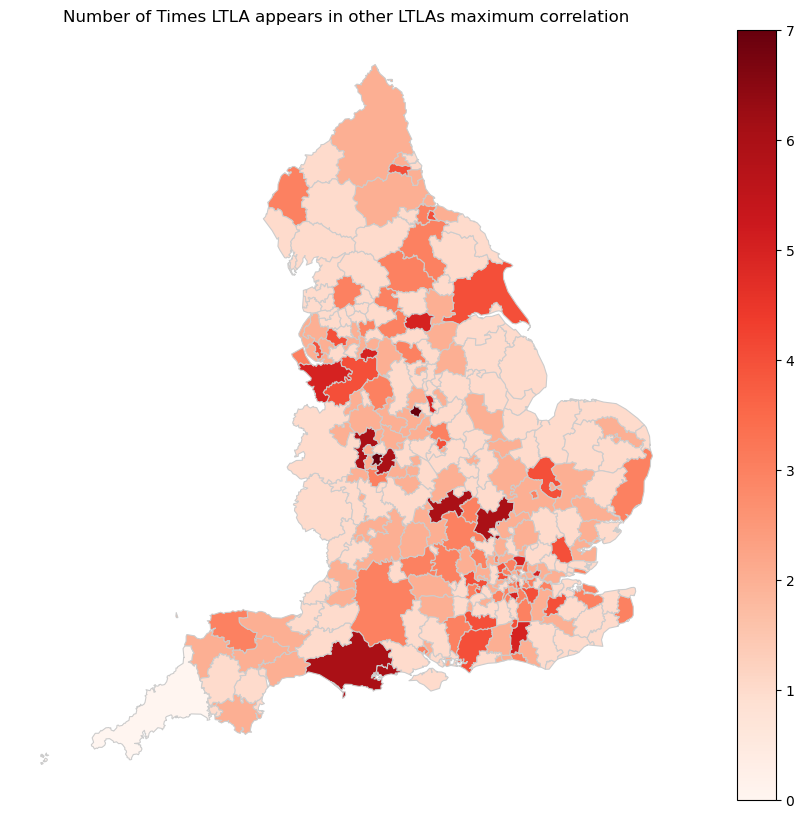

In [303]:
variable = 'No. Correlations'
vmin, vmax = 0.0, 7.0
fig, ax = plt.subplots(1, figsize =(14, 10))
ax.axis('off')
ax.set_title('Number of Times LTLA appears in other LTLAs maximum correlation')
sm = plt.cm.ScalarMappable(cmap='Reds', norm=plt.Normalize(vmin=vmin, vmax=vmax))

sm._A = []

cbar = fig.colorbar(sm)

n_corrs.plot(column=variable, cmap='Reds', linewidth=0.8, ax=ax, edgecolor='0.8')
plt.show()

In [320]:
r_corrs.loc[r_corrs['LTLA 1'] == 'Brighton and Hove']

,LTLA 1,LTLA 2,Maximum Correlation,Lag in Days
34055,Brighton and Hove,Northumberland,0.300286,-8.0
34056,Brighton and Hove,Huntingdonshire,0.700136,-2.0
34057,Brighton and Hove,Hart,0.710005,-2.0
34058,Brighton and Hove,Hyndburn,0.419308,3.0
34059,Brighton and Hove,South Kesteven,0.747348,-1.0
...,...,...,...,...
34225,Brighton and Hove,Colchester,0.678558,2.0
34226,Brighton and Hove,Basingstoke and Deane,0.636503,4.0
34227,Brighton and Hove,Tunbridge Wells,0.615308,-1.0
34228,Brighton and Hove,Rushcliffe,0.710692,0.0


In [321]:
cities = ['Birmingham', 'Manchester', 'Liverpool', 'Leeds', 'Sheffield', 'Bristol, City of', 'Leicester', 'Stoke-on-Trent', 'Coventry', 'Newcastle upon Tyne', 'Nottingham', 'Wirral', 'Bradford', 'Plymouth', 'Brighton and Hove']

In [339]:
cities_corrs = [(r_corrs.loc[r_corrs['LTLA 1'] == cities[i]]) for i in range(len(cities))]

In [340]:
cities_corrsdf = pd.concat(cities_corrs)

In [341]:
cities_corrsdf

,LTLA 1,LTLA 2,Maximum Correlation,Lag in Days
47685,Birmingham,Sandwell,0.920455,0.0
47686,Birmingham,Wakefield,0.741564,-1.0
47687,Birmingham,Hartlepool,0.809224,-3.0
47688,Birmingham,"Kingston upon Hull, City of",0.571787,0.0
47689,Birmingham,Rutland,0.368921,-4.0
...,...,...,...,...
34225,Brighton and Hove,Colchester,0.678558,2.0
34226,Brighton and Hove,Basingstoke and Deane,0.636503,4.0
34227,Brighton and Hove,Tunbridge Wells,0.615308,-1.0
34228,Brighton and Hove,Rushcliffe,0.710692,0.0


In [342]:
cities_corrs2 = [cities_corrsdf.loc[cities_corrsdf['LTLA 2'] == cities[i]] for i in range(len(cities))]

In [343]:
cities_corrsdf2 = pd.concat(cities_corrs2)

In [367]:
cities_corrsdup = cities_corrsdf2.rename(columns={'LTLA 1':'LTLA 2', 'LTLA 2':'LTLA 1'})

In [368]:
cities_corrsdup

,LTLA 2,LTLA 1,Maximum Correlation,Lag in Days
45992,Manchester,Birmingham,0.663824,0.0
33642,Liverpool,Birmingham,0.792428,0.0
40880,Leeds,Birmingham,0.688172,0.0
46620,Sheffield,Birmingham,0.511274,-3.0
41010,"Bristol, City of",Birmingham,0.614818,-1.0
...,...,...,...,...
25626,Coventry,Brighton and Hove,0.411824,-3.0
10219,Newcastle upon Tyne,Brighton and Hove,0.304066,94.0
9939,Wirral,Brighton and Hove,0.482080,-4.0
2614,Bradford,Brighton and Hove,0.308522,75.0


In [369]:
cities_corrs_heat = pd.concat([cities_corrsdf2, cities_corrsdup])

In [370]:
cities_corrs_heat

,LTLA 1,LTLA 2,Maximum Correlation,Lag in Days
45992,Manchester,Birmingham,0.663824,0.0
33642,Liverpool,Birmingham,0.792428,0.0
40880,Leeds,Birmingham,0.688172,0.0
46620,Sheffield,Birmingham,0.511274,-3.0
41010,"Bristol, City of",Birmingham,0.614818,-1.0
...,...,...,...,...
25626,Brighton and Hove,Coventry,0.411824,-3.0
10219,Brighton and Hove,Newcastle upon Tyne,0.304066,94.0
9939,Brighton and Hove,Wirral,0.482080,-4.0
2614,Brighton and Hove,Bradford,0.308522,75.0


In [353]:
cities_corrsdf2.nlargest(1,'Maximum Correlation')

,LTLA 1,LTLA 2,Maximum Correlation,Lag in Days
25742,Coventry,Birmingham,0.922752,0.0


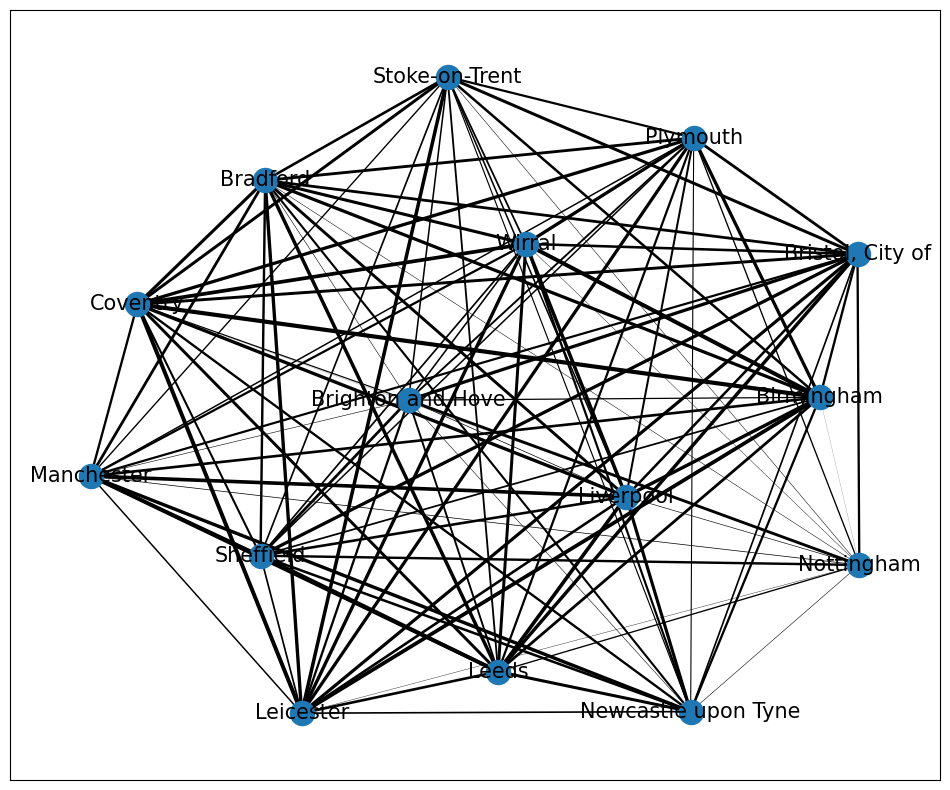

In [358]:
G = nx.from_pandas_edgelist(cities_corrsdf2,'LTLA 1','LTLA 2', edge_attr='Maximum Correlation')
corrs = [i['Maximum Correlation'] for i in dict(G.edges).values()]
#distance = [i['Distance between centroids'] for i in dict(G.edges).values()]
labels = [i for i in dict(G.nodes).keys()]
labels = {i:i for i in dict(G.nodes).keys()}


def normalize(values, bounds):
    return [bounds['desired']['lower'] + (x - bounds['actual']['lower']) * (bounds['desired']['upper'] - bounds['desired']['lower']) / (bounds['actual']['upper'] - bounds['actual']['lower']) for x in values]
corrs_new = normalize(corrs,{'actual':{'lower':0.237,'upper':0.9228},'desired':{'lower':0.1,'upper':3}})
#carac = pd.DataFrame({ 'Region':['North East', 'North West', 'West Midlands','East Midlands','East of England', 'South East', 'London', 'South West'], 'myvalue':['group1','group2','group3','group4','group5', 'group6', 'group7', 'group8'] })
#swr_max_corrs['Region 1']=pd.Categorical(swr_max_corrs['Region 1'])
#swr_max_corrs['Region 1'].cat.codes

fig, ax = plt.subplots(figsize=(12,10))
pos = nx.spring_layout(G, seed=7)
nx.draw_networkx_nodes(G, pos, ax = ax, node_size =300, label=True)
nx.draw_networkx_edges(G, pos, width=corrs_new, ax=ax)
nx.draw_networkx_labels(G, pos, labels, font_size = 15, ax=ax)

plt.show()

In [371]:
heatmap = cities_corrs_heat.pivot(index = 'LTLA 1', columns = 'LTLA 2', values = 'Maximum Correlation')

In [373]:
heatmap = heatmap.fillna(1)
heatmap

LTLA 2,Birmingham,Bradford,Brighton and Hove,"Bristol, City of",Coventry,Leeds,Leicester,Liverpool,Manchester,Newcastle upon Tyne,Nottingham,Plymouth,Sheffield,Stoke-on-Trent,Wirral
LTLA 1,,,,,,,,,,,,,,,
Birmingham,1.000000,0.766306,0.423114,0.614818,0.922752,0.688172,0.853098,0.792428,0.663824,0.602322,0.237548,0.768371,0.511274,0.643726,0.900224
Bradford,0.766306,1.000000,0.308522,0.687067,0.743733,0.801916,0.781908,0.709115,0.685983,0.571392,0.297097,0.697952,0.623930,0.658668,0.736809
Brighton and Hove,0.423114,0.308522,1.000000,0.764891,0.411824,0.538437,0.602384,0.331040,0.307839,0.304066,0.701131,0.537467,0.681462,0.476828,0.482080
"Bristol, City of",0.614818,0.687067,0.764891,1.000000,0.713223,0.796638,0.759013,0.644977,0.584977,0.499852,0.603792,0.690433,0.769018,0.728953,0.649768
Coventry,0.922752,0.743733,0.411824,0.713223,1.000000,0.715084,0.887305,0.779008,0.608862,0.612084,0.241755,0.767600,0.564592,0.722461,0.844908
Leeds,0.688172,0.801916,0.538437,0.796638,0.715084,1.000000,0.661242,0.827958,0.824825,0.726038,0.439482,0.594756,0.857780,0.526872,0.722125
Leicester,0.853098,0.781908,0.602384,0.759013,0.887305,0.661242,1.000000,0.659210,0.468516,0.493200,0.275943,0.763163,0.507142,0.811958,0.784389
Liverpool,0.792428,0.709115,0.331040,0.644977,0.779008,0.827958,0.659210,1.000000,0.827036,0.747219,0.320149,0.558914,0.655529,0.478511,0.806793
Manchester,0.663824,0.685983,0.307839,0.584977,0.608862,0.824825,0.468516,0.827036,1.000000,0.793550,0.334027,0.466399,0.748669,0.446576,0.600543


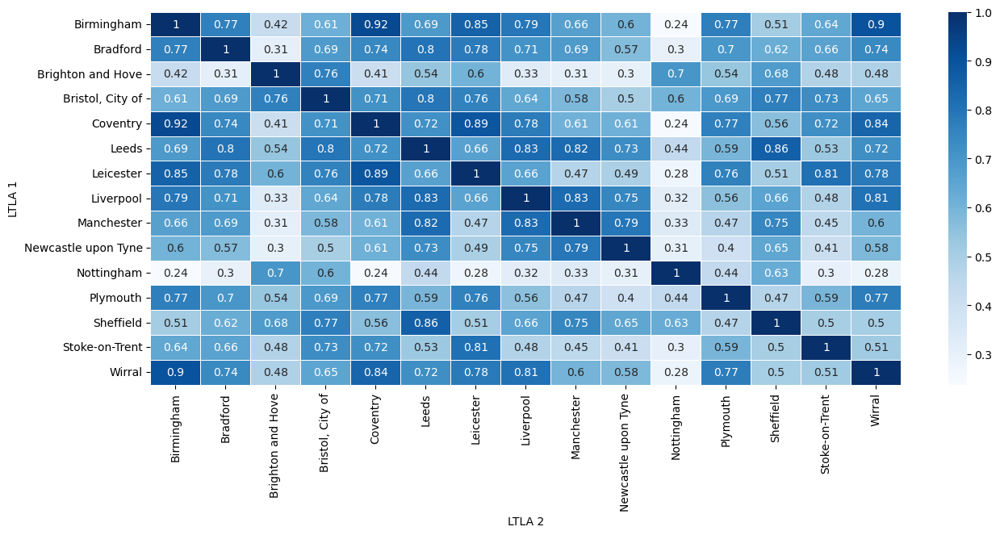

In [377]:
f, ax = plt.subplots(figsize=(15, 6))
sns.heatmap(heatmap, annot=True, cmap = 'Blues',linewidths=.5, ax=ax)
plt.show()

In [387]:
import holoviews as hv
from holoviews import opts, dim

In [388]:
hv.extension('matplotlib')
hv.output(fig='svg', size=500)

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W

In [480]:
maxcorrs_cities = cities_corrsdf2['Maximum Correlation'].values.tolist()

In [481]:
def normalize(values, bounds):
    return [bounds['desired']['lower'] + (x - bounds['actual']['lower']) * (bounds['desired']['upper'] - bounds['desired']['lower']) / (bounds['actual']['upper'] - bounds['actual']['lower']) for x in values]
cities_corrs_new = normalize(maxcorrs_cities,{'actual':{'lower':0.23,'upper':0.93},'desired':{'lower':1,'upper':10}})

In [482]:
chord_cities = cities_corrsdf2.rename(columns={'LTLA 1':'source', 'LTLA 2':'target'})
chord_cities['value'] = cities_corrs_new                            

In [483]:
chord_cities

,source,target,Maximum Correlation,Lag in Days,value
45992,Manchester,Birmingham,0.663824,0.0,6.577742
33642,Liverpool,Birmingham,0.792428,0.0,8.231214
40880,Leeds,Birmingham,0.688172,0.0,6.890788
46620,Sheffield,Birmingham,0.511274,-3.0,4.616382
41010,"Bristol, City of",Birmingham,0.614818,-1.0,5.947662
...,...,...,...,...,...
25626,Coventry,Brighton and Hove,0.411824,-3.0,3.337738
10219,Newcastle upon Tyne,Brighton and Hove,0.304066,94.0,1.952280
9939,Wirral,Brighton and Hove,0.482080,-4.0,4.241029
2614,Bradford,Brighton and Hove,0.308522,75.0,2.009571


In [445]:
chord_cities['source'].iloc[0]

'Manchester'

In [448]:
def lag_direction(df):

    for i in range(len(df)):
    
        if df['Lag in Days'].iloc[i] >=0:
            df['source'].iloc[i] == df['source'].iloc[i]
        else:
            df['source'].iloc[i] == df['target'].iloc[i]
            df['target'].iloc[i] == df['source'].iloc[i]
        return df
        



In [486]:
def lag_direction(df1, df2, df3):
    

    for i in range(len(df1)):
    
        if int(df1['Lag in Days'].iloc[i]) < 0:
    
     
            df1['source'].iloc[i] = df2['target'].iloc[i]
            df1['target'].iloc[i] = df3['source'].iloc[i]
   
    return df1
        

In [487]:
chord_citiesrep2

,source,target,Lag in Days
45992,Manchester,Birmingham,0.0
33642,Liverpool,Birmingham,0.0
40880,Leeds,Birmingham,0.0
46620,Sheffield,Birmingham,-3.0
41010,"Bristol, City of",Birmingham,-1.0
...,...,...,...
25626,Coventry,Brighton and Hove,-3.0
10219,Newcastle upon Tyne,Brighton and Hove,94.0
9939,Wirral,Brighton and Hove,-4.0
2614,Bradford,Brighton and Hove,75.0


In [489]:
chord_lagdirection = lag_direction(chord_cities, chord_citiesrep, chord_citiesrep2)

/var/folders/5m/nyccnvvs4197vfzljd054r300000gn/T/ipykernel_45424/1222803088.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df1['source'].iloc[i] = df2['target'].iloc[i]
/var/folders/5m/nyccnvvs4197vfzljd054r300000gn/T/ipykernel_45424/1222803088.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df1['target'].iloc[i] = df3['source'].iloc[i]


In [499]:
chord_lagdirection.loc[chord_lagdirection['source'] == 'Bradford']

,source,target,Maximum Correlation,Lag in Days,value
2730,Bradford,Birmingham,0.766306,0.0,7.895367
2706,Bradford,Manchester,0.685983,0.0,6.862643
2611,Bradford,Liverpool,0.709115,0.0,7.160053
2658,Bradford,Leeds,0.801916,1.0,8.353211
2714,Bradford,Sheffield,0.623930,2.0,6.064808
2659,Bradford,"Bristol, City of",0.687067,3.0,6.876576
2684,Bradford,Leicester,0.781908,1.0,8.095963
2511,Bradford,Stoke-on-Trent,0.658668,2.0,6.511441
2571,Bradford,Coventry,0.743733,0.0,7.605137
2509,Bradford,Newcastle upon Tyne,0.571392,1.0,5.389330


In [484]:
chord_citiesrep = chord_cities.drop(columns = ['value'])
chord_citiesrep

,source,target,Maximum Correlation,Lag in Days
45992,Manchester,Birmingham,0.663824,0.0
33642,Liverpool,Birmingham,0.792428,0.0
40880,Leeds,Birmingham,0.688172,0.0
46620,Sheffield,Birmingham,0.511274,-3.0
41010,"Bristol, City of",Birmingham,0.614818,-1.0
...,...,...,...,...
25626,Coventry,Brighton and Hove,0.411824,-3.0
10219,Newcastle upon Tyne,Brighton and Hove,0.304066,94.0
9939,Wirral,Brighton and Hove,0.482080,-4.0
2614,Bradford,Brighton and Hove,0.308522,75.0


In [485]:
chord_citiesrep2 = chord_citiesrep.drop(columns = ['Maximum Correlation'])

In [411]:
city_index = pd.Series(cities).astype('category').cat.codes.values

In [413]:
city_index = list(city_index)

In [430]:
cities_zip = list(zip(cities, city_index))

cities_index = pd.DataFrame(cities_zip, columns = ['name','index'])
cities_index = cities_index.iloc[:, [1,0]]
cities_index

,index,name
0,0,Birmingham
1,8,Manchester
2,7,Liverpool
3,5,Leeds
4,12,Sheffield
5,3,"Bristol, City of"
6,6,Leicester
7,13,Stoke-on-Trent
8,4,Coventry
9,9,Newcastle upon Tyne


In [491]:
chord_cities2 = chord_lagdirection.merge(cities_index, how='left', left_on = 'source', right_on = 'name')
chord_cities2 = chord_cities2.merge(cities_index, how='left', left_on = 'target', right_on = 'name')
chord_cities2

,source,target,Maximum Correlation,Lag in Days,value,index_x,name_x,index_y,name_y
0,Manchester,Birmingham,0.663824,0.0,6.577742,8,Manchester,0,Birmingham
1,Liverpool,Birmingham,0.792428,0.0,8.231214,7,Liverpool,0,Birmingham
2,Leeds,Birmingham,0.688172,0.0,6.890788,5,Leeds,0,Birmingham
3,Birmingham,Sheffield,0.511274,-3.0,4.616382,0,Birmingham,12,Sheffield
4,Birmingham,"Bristol, City of",0.614818,-1.0,5.947662,0,Birmingham,3,"Bristol, City of"
...,...,...,...,...,...,...,...,...,...
100,Brighton and Hove,Coventry,0.411824,-3.0,3.337738,2,Brighton and Hove,4,Coventry
101,Newcastle upon Tyne,Brighton and Hove,0.304066,94.0,1.952280,9,Newcastle upon Tyne,2,Brighton and Hove
102,Brighton and Hove,Wirral,0.482080,-4.0,4.241029,2,Brighton and Hove,14,Wirral
103,Bradford,Brighton and Hove,0.308522,75.0,2.009571,1,Bradford,2,Brighton and Hove


In [492]:
nodes = hv.Dataset(cities_index, 'index')

In [493]:
nodes

:Dataset   [index]   (name)

In [494]:
chord_cities2 = chord_cities2.drop(columns = ['source', 'target', 'name_x', 'name_y'])
chord_cities2 = chord_cities2.rename(columns={'index_x':'source','index_y':'target'})
chord_cities2 = chord_cities2.drop(columns = ['Maximum Correlation', 'Lag in Days'])

In [495]:
chord_cities2['value'] = chord_cities2['value'].round(0)

In [496]:
chord_cities2 = chord_cities2.iloc[:, [1,2,0]]

In [497]:
chord_cities2

,source,target,value
0,8,0,7.0
1,7,0,8.0
2,5,0,7.0
3,0,12,5.0
4,0,3,6.0
...,...,...,...
100,2,4,3.0
101,9,2,2.0
102,2,14,4.0
103,1,2,2.0


In [498]:
hv.Chord((chord_cities2, nodes)).opts(opts.Chord(cmap='Category20', edge_color=dim('source').astype(str), labels='name', node_color=dim('index').astype(str)))

:Chord   [source,target]   (value)

In [500]:
maxcorrs_region

,Unnamed: 0,index,LTLA 1,LTLA 2,Maximum Correlation,Lag in Days,Distance between centroids,Region 1,Colour_x,Region 2,Colour_y
0,0,147,Redcar and Cleveland,Middlesbrough,0.896964,0,13.113734,North East,cyan,North East,cyan
1,1,382,East Devon,Staffordshire Moorlands,0.811118,1,271.127694,South West,blue,West Midlands,grey
2,2,868,Havant,Central Bedfordshire,0.892135,4,134.499109,South East,green,East of England,orange
3,3,1026,Surrey Heath,Three Rivers,0.868553,1,38.328563,South East,green,East of England,orange
4,4,1415,Worthing,Adur,0.841924,1,7.040460,South East,green,South East,green
...,...,...,...,...,...,...,...,...,...,...,...
308,308,43344,Broadland,South Hams,0.867671,3,440.006610,East of England,orange,South West,blue
309,309,47559,Cherwell,Colchester,0.888262,1,147.122134,South East,green,East of England,orange
310,310,42548,Haringey,Basingstoke and Deane,0.853595,8,83.770810,London,red,South East,green
311,311,49046,Tonbridge and Malling,Tunbridge Wells,0.861480,1,18.477668,South East,green,South East,green


In [501]:
chord_ltlas = maxcorrs_region.drop(columns = ['Unnamed: 0', 'index', 'LTLA 1', 'LTLA 2', 'Lag in Days', 'Distance between centroids', 'Colour_x', 'Colour_y'])
chord_ltlas = chord_ltlas.rename(columns={'Region 1':'source','Region 2':'target', 'Maximum Correlation':'value'})
chord_ltlas = chord_ltlas.iloc[:, [1,2,0]]

In [507]:
chord_ltlas = chord_ltlas.loc[chord_ltlas['source'] != 'purple']

In [508]:
regions = list(chord_ltlas['source'].unique())
regions

['North East',
 'South West',
 'South East',
 'North West',
 'Yorkshire and The Humber',
 'London',
 'East of England',
 'East Midlands',
 'West Midlands']

In [509]:
region_index = pd.Series(regions).astype('category').cat.codes.values

In [510]:
regions_zip = list(zip(regions, region_index))

regions_index = pd.DataFrame(regions_zip, columns = ['name','index'])

regions_index

,name,index
0,North East,3
1,South West,6
2,South East,5
3,North West,4
4,Yorkshire and The Humber,8
5,London,2
6,East of England,1
7,East Midlands,0
8,West Midlands,7


In [569]:
nodes2 = hv.Dataset(regions_index, 'index')

In [610]:
chord_regions = chord_ltlas.merge(regions_index, how='left', left_on = 'source', right_on = 'name')
chord_regions = chord_regions.merge(regions_index, how='left', left_on = 'target', right_on = 'name')
chord_regions

,source,target,value,index_x,name_x,index_y,name_y
0,North East,North East,0.896964,3,North East,3,North East
1,South West,West Midlands,0.811118,6,South West,7,West Midlands
2,South East,East of England,0.892135,5,South East,1,East of England
3,South East,East of England,0.868553,5,South East,1,East of England
4,South East,South East,0.841924,5,South East,5,South East
...,...,...,...,...,...,...,...
307,East of England,South West,0.867671,1,East of England,6,South West
308,South East,East of England,0.888262,5,South East,1,East of England
309,London,South East,0.853595,2,London,5,South East
310,South East,South East,0.861480,5,South East,5,South East


In [611]:
chord_regions = chord_regions.drop(columns = ['source', 'target', 'name_x', 'name_y'])
chord_regions = chord_regions.rename(columns={'index_x':'source','index_y':'target'})


In [614]:
chord_regions = chord_regions.iloc[:, [0,2,1]]

In [613]:
chord_regions['value'] = chord_regions['value'].round(0)
chord_regions

,source,value,target
0,3,1.0,3
1,6,1.0,7
2,5,1.0,1
3,5,1.0,1
4,5,1.0,5
...,...,...,...
307,1,1.0,6
308,5,1.0,1
309,2,1.0,5
310,5,1.0,5


In [616]:
chord_regions_london = chord_regions.loc[chord_regions['source'] == 2]

In [536]:
ltla_corrs = list(chord_regions['value'])

In [539]:
max(ltla_corrs)

0.958269349

In [540]:
def normalize(values, bounds):
    return [bounds['desired']['lower'] + (x - bounds['actual']['lower']) * (bounds['desired']['upper'] - bounds['desired']['lower']) / (bounds['actual']['upper'] - bounds['actual']['lower']) for x in values]
ltla_corrs_new = normalize(ltla_corrs,{'actual':{'lower':0.69,'upper':0.96},'desired':{'lower':1,'upper':10}})

In [541]:
chord_region = chord_regions.drop(columns=['value'])
chord_region['value'] = ltla_corrs_new

In [542]:
chord_region

,target,source,value
0,3,3,7.898806
1,7,6,5.037255
2,1,5,7.737835
3,1,5,6.951753
4,5,5,6.064132
...,...,...,...
307,6,1,6.922364
308,1,5,7.608747
309,5,2,6.453165
310,5,5,6.715987


In [640]:
nodes = hv.Dataset(pd.DataFrame.from_records([
    {'index': 0, 'name': "East Midlands"},
    {'index': 1, 'name': "East of England"},
    {'index': 2, 'name': "London"},
    {'index': 3, 'name': "North East"},
    {'index': 4, 'name': "North West"},
    {'index': 5, 'name': "South East"},
    {'index': 6, 'name': "South West"},
    {'index': 7, 'name': "West Midlands"},
    {'index': 8, 'name': "Yorkshire and The Humber"},
    ]), 'index')


In [639]:
connections = pd.DataFrame.from_records([
    {'source': 0, 'target': 0, 'value':15},
    {'source': 0, 'target': 1, 'value':5},
    {'source': 0, 'target': 5, 'value':8},
    {'source': 0, 'target': 6, 'value':3},
    {'source': 0, 'target': 7, 'value':9},
    {'source': 0, 'target': 8, 'value':2},
    {'source': 1, 'target': 1, 'value':8},
    {'source': 1, 'target': 2, 'value':3},
    {'source': 1, 'target': 4, 'value':1},
    {'source': 1, 'target': 5, 'value':16},
    {'source': 1, 'target': 6, 'value':7},
    {'source': 2, 'target': 1, 'value':7},
    {'source': 2, 'target': 2, 'value':28},
    {'source': 2, 'target': 4, 'value':1},
    {'source': 2, 'target': 5, 'value':9},
    {'source': 3, 'target': 3, 'value':8},
    {'source': 3, 'target': 4, 'value':5},
    {'source': 3, 'target': 6, 'value':1},
    {'source': 3, 'target': 8, 'value':2},
    {'source': 4, 'target': 0, 'value':1},
    {'source': 4, 'target': 3, 'value':1},
    {'source': 4, 'target': 4, 'value':24},
    {'source': 4, 'target': 5, 'value':5},
    {'source': 4, 'target': 6, 'value':1},
    {'source': 4, 'target': 7, 'value':4},
    {'source': 4, 'target': 8, 'value':1},
    {'source': 5, 'target': 0, 'value':1},
    {'source': 5, 'target': 1, 'value':16},
    {'source': 5, 'target': 2, 'value':8},
    {'source': 5, 'target': 5, 'value':27},
    {'source': 5, 'target': 6, 'value':7},
    {'source': 5, 'target': 8, 'value':1},
    {'source': 6, 'target': 0, 'value':4},
    {'source': 6, 'target': 1, 'value':6},
    {'source': 6, 'target': 5, 'value':6},
    {'source': 6, 'target': 6, 'value':5},
    {'source': 6, 'target': 7, 'value':5},
    {'source': 6, 'target': 8, 'value':1},
    {'source': 7, 'target': 0, 'value':5},
    {'source': 7, 'target': 1, 'value':2},
    {'source': 7, 'target': 4, 'value':2},
    {'source': 7, 'target': 5, 'value':3},
    {'source': 7, 'target': 6, 'value':1},
    {'source': 7, 'target': 7, 'value':15},
    {'source': 7, 'target': 8, 'value':1},
    {'source': 8, 'target': 0, 'value':3},
    {'source': 8, 'target': 1, 'value':1},
    {'source': 8, 'target': 3, 'value':1},
    {'source': 8, 'target': 4, 'value':3},
    {'source': 8, 'target': 7, 'value':2},
    {'source': 8, 'target': 8, 'value':11},
])

In [641]:
hv.Chord((connections,nodes)).opts(opts.Chord(cmap='Category20', edge_color=dim('source').astype(str), labels='name', node_color=dim('index').astype(str)))

:Chord   [source,target]   (value)

In [268]:
ltla_list = list(d)
ltla_list = [i[0] for i in ltla_list]

In [269]:
ltla_list

['Redcar and Cleveland',
 'Middlesbrough',
 'East Devon',
 'Staffordshire Moorlands',
 'Havant',
 'Central Bedfordshire',
 'Surrey Heath',
 'Three Rivers',
 'Worthing',
 'Adur',
 'Bolton',
 'Sandwell',
 'Trafford',
 'Stockport',
 'Barnsley',
 'Wakefield',
 'Bradford',
 'Kirklees',
 'Barnet',
 'Harrow',
 'Hounslow',
 'Ealing',
 'Wandsworth',
 'Lambeth',
 'Westminster',
 'South Bucks',
 'Elmbridge',
 'Braintree',
 'Enfield',
 'Winchester',
 'Chichester',
 'Rossendale',
 'Ribble Valley',
 'South Northamptonshire',
 'Babergh',
 'Selby',
 'Corby',
 'Mendip',
 'Woking',
 'Mid Suffolk',
 'Bromsgrove',
 'Stafford',
 'Gateshead',
 'Hambleton',
 'Merton',
 'Bromley',
 'Reading',
 'Haringey',
 'Fenland',
 'Brighton and Hove',
 'South Lakeland',
 'Portsmouth',
 'Cotswold',
 'Dacorum',
 'North Hertfordshire',
 'Great Yarmouth',
 'Allerdale',
 'South Somerset',
 'South Kesteven',
 'Malvern Hills',
 'Mid Sussex',
 'Wirral',
 'Birmingham',
 'Newcastle upon Tyne',
 'Manchester',
 'Stockton-on-Tees',
 '

In [270]:
ltla_df = pd.DataFrame(ltla_list)

In [271]:
ltla_df.rename(columns={ ltla_df.columns[0]: "LTLA" }, inplace = True)

In [272]:
ltla_df

,LTLA
0,Redcar and Cleveland
1,Middlesbrough
2,East Devon
3,Staffordshire Moorlands
4,Havant
...,...
309,Teignbridge
310,Wyre
311,North Warwickshire
312,Stevenage


In [186]:
ltla_df = ltla_df.merge(ltla2region, how='left', left_on = 'LTLA', right_on='LAD19NM')

In [187]:
ltla_df

,LTLA,Unnamed: 0,LAD19NM,RGN19NM,Colour
0,Redcar and Cleveland,176.0,Redcar and Cleveland,North East,cyan
1,Middlesbrough,175.0,Middlesbrough,North East,cyan
2,East Devon,90.0,East Devon,South West,blue
3,Staffordshire Moorlands,122.0,Staffordshire Moorlands,West Midlands,grey
4,Havant,237.0,Havant,South East,green
...,...,...,...,...,...
309,Teignbridge,95.0,Teignbridge,South West,blue
310,Wyre,275.0,Wyre,North West,black
311,North Warwickshire,140.0,North Warwickshire,West Midlands,grey
312,Stevenage,248.0,Stevenage,East of England,orange


In [225]:
ltla_df = ltla_df.replace(np.nan, 'blue') 

In [226]:
colours2 = ltla_df["Colour"].values.tolist()

In [227]:
colours2

['cyan',
 'cyan',
 'blue',
 'grey',
 'green',
 'orange',
 'green',
 'orange',
 'green',
 'green',
 'black',
 'grey',
 'black',
 'black',
 'purple',
 'purple',
 'purple',
 'purple',
 'red',
 'red',
 'red',
 'red',
 'red',
 'red',
 'red',
 'green',
 'green',
 'orange',
 'red',
 'green',
 'green',
 'black',
 'black',
 'yellow',
 'orange',
 'purple',
 'yellow',
 'blue',
 'green',
 'orange',
 'grey',
 'grey',
 'cyan',
 'purple',
 'red',
 'red',
 'green',
 'red',
 'orange',
 'green',
 'black',
 'green',
 'blue',
 'orange',
 'orange',
 'orange',
 'black',
 'blue',
 'yellow',
 'grey',
 'green',
 'black',
 'grey',
 'cyan',
 'black',
 'cyan',
 'black',
 'grey',
 'yellow',
 'blue',
 'yellow',
 'orange',
 'orange',
 'black',
 'grey',
 'yellow',
 'purple',
 'orange',
 'green',
 'red',
 'black',
 'black',
 'red',
 'red',
 'red',
 'cyan',
 'grey',
 'orange',
 'red',
 'orange',
 'green',
 'green',
 'orange',
 'yellow',
 'blue',
 'grey',
 'green',
 'grey',
 'grey',
 'yellow',
 'orange',
 'orange',
 're

In [224]:
ltla_df.iloc[173]

LTLA          Cornwall and Isles of Scilly
Unnamed: 0                             NaN
LAD19NM                                NaN
RGN19NM                                NaN
Colour                                 NaN
Name: 173, dtype: object

In [196]:
colours = maxcorrs_region["Colour_x"].values.tolist()

In [197]:
colours.append('yellow')

In [206]:
type(colours)

list

In [205]:
type(colours2)

list

In [213]:
from collections import Counter
words = colours2

print(Counter(words).keys()) # equals to list(set(words))
print(Counter(words).values())

dict_keys(['cyan', 'blue', 'grey', 'green', 'orange', 'black', 'purple', 'red', 'yellow', nan])
dict_values([12, 28, 30, 67, 45, 39, 21, 31, 40, 1])


In [133]:
ltla2region = ltla2region.replace(np.nan, 'purple') 

In [164]:
ltla_colours = dict(zip(ltla2region.LAD19NM, ltla2region.Colour))

In [167]:
c_maps = [v for k, v in ltla_colours]
colours_new = [x for x in c_maps]

ValueError: too many values to unpack (expected 2)

In [170]:
type(ltla_colours)

dict

In [161]:
c_nodes = []
for idx, row in ltla2region.iterrows():
    c_nodes.append(({row["LAD19NM"]: row.Colour}))
c_nodes

[{'City of London': 'red'},
 {'Wiltshire': 'blue'},
 {'Barking and Dagenham': 'red'},
 {'Barnet': 'red'},
 {'Bexley': 'red'},
 {'Brent': 'red'},
 {'Bromley': 'red'},
 {'Camden': 'red'},
 {'Croydon': 'red'},
 {'Ealing': 'red'},
 {'Enfield': 'red'},
 {'Peterborough': 'orange'},
 {'Luton': 'orange'},
 {'Greenwich': 'red'},
 {'Hackney': 'red'},
 {'Bedford': 'orange'},
 {'Central Bedfordshire': 'orange'},
 {'Hammersmith and Fulham': 'red'},
 {'Haringey': 'red'},
 {'Southend-on-Sea': 'orange'},
 {'Thurrock': 'orange'},
 {'Harrow': 'red'},
 {'Havering': 'red'},
 {'Medway': 'green'},
 {'Bracknell Forest': 'green'},
 {'Hillingdon': 'red'},
 {'Hounslow': 'red'},
 {'West Berkshire': 'green'},
 {'Islington': 'red'},
 {'Kensington and Chelsea': 'red'},
 {'Reading': 'green'},
 {'Slough': 'green'},
 {'Kingston upon Thames': 'red'},
 {'Lambeth': 'red'},
 {'Windsor and Maidenhead': 'green'},
 {'Wokingham': 'green'},
 {'Lewisham': 'red'},
 {'Merton': 'red'},
 {'Milton Keynes': 'green'},
 {'Rushcliffe': 

dict

In [152]:
d

DegreeView({'Redcar and Cleveland': 1, 'Middlesbrough': 3, 'East Devon': 1, 'Staffordshire Moorlands': 2, 'Havant': 1, 'Central Bedfordshire': 5, 'Surrey Heath': 1, 'Three Rivers': 2, 'Worthing': 1, 'Adur': 1, 'Bolton': 1, 'Sandwell': 7, 'Trafford': 1, 'Stockport': 4, 'Barnsley': 1, 'Wakefield': 5, 'Bradford': 2, 'Kirklees': 2, 'Barnet': 3, 'Harrow': 4, 'Hounslow': 1, 'Ealing': 3, 'Wandsworth': 2, 'Lambeth': 3, 'Westminster': 1, 'South Bucks': 1, 'Elmbridge': 2, 'Braintree': 1, 'Enfield': 4, 'Winchester': 1, 'Chichester': 3, 'Rossendale': 1, 'Ribble Valley': 3, 'South Northamptonshire': 5, 'Babergh': 1, 'Selby': 1, 'Corby': 1, 'Mendip': 1, 'Woking': 2, 'Mid Suffolk': 1, 'Bromsgrove': 2, 'Stafford': 1, 'Gateshead': 3, 'Hambleton': 2, 'Merton': 2, 'Bromley': 3, 'Reading': 1, 'Haringey': 3, 'Fenland': 1, 'Brighton and Hove': 2, 'South Lakeland': 1, 'Portsmouth': 2, 'Cotswold': 2, 'Dacorum': 1, 'North Hertfordshire': 1, 'Great Yarmouth': 1, 'Allerdale': 3, 'South Somerset': 1, 'South Keste

In [138]:
c_maps = [v for k, v in c_nodes]
colours_new = [x for x in c_maps]

ValueError: not enough values to unpack (expected 2, got 1)

In [149]:
colours.append('yellow')

In [156]:
maxcorrs_region

,Unnamed: 0,index,LTLA 1,LTLA 2,Maximum Correlation,Lag in Days,Distance between centroids,Region 1,Colour_x,Region 2,Colour_y
0,0,147,Redcar and Cleveland,Middlesbrough,0.896964,0,13.113734,North East,cyan,North East,cyan
1,1,382,East Devon,Staffordshire Moorlands,0.811118,1,271.127694,South West,blue,West Midlands,grey
2,2,868,Havant,Central Bedfordshire,0.892135,4,134.499109,South East,green,East of England,orange
3,3,1026,Surrey Heath,Three Rivers,0.868553,1,38.328563,South East,green,East of England,orange
4,4,1415,Worthing,Adur,0.841924,1,7.040460,South East,green,South East,green
...,...,...,...,...,...,...,...,...,...,...,...
308,308,43344,Broadland,South Hams,0.867671,3,440.006610,East of England,orange,South West,blue
309,309,47559,Cherwell,Colchester,0.888262,1,147.122134,South East,green,East of England,orange
310,310,42548,Haringey,Basingstoke and Deane,0.853595,8,83.770810,London,red,South East,green
311,311,49046,Tonbridge and Malling,Tunbridge Wells,0.861480,1,18.477668,South East,green,South East,green


In [155]:
colours

['cyan',
 'blue',
 'green',
 'green',
 'green',
 'black',
 'black',
 'purple',
 'purple',
 'red',
 'red',
 'red',
 'red',
 'green',
 'orange',
 'green',
 'black',
 'yellow',
 'purple',
 'blue',
 'yellow',
 'grey',
 'cyan',
 'red',
 'green',
 'orange',
 'black',
 'yellow',
 'red',
 'orange',
 'orange',
 'blue',
 'grey',
 'black',
 'cyan',
 'cyan',
 'grey',
 'blue',
 'black',
 'yellow',
 'orange',
 'black',
 'yellow',
 'purple',
 'green',
 'black',
 'red',
 'red',
 'cyan',
 'grey',
 'orange',
 'orange',
 'black',
 'orange',
 'yellow',
 'grey',
 'grey',
 'grey',
 'orange',
 'red',
 'red',
 'blue',
 'orange',
 'yellow',
 'yellow',
 'blue',
 'green',
 'yellow',
 'orange',
 'yellow',
 'blue',
 'grey',
 'red',
 'red',
 'purple',
 'blue',
 'blue',
 'yellow',
 'blue',
 'black',
 'green',
 'orange',
 'blue',
 'black',
 'yellow',
 'grey',
 'grey',
 'grey',
 'black',
 'yellow',
 'orange',
 'orange',
 'yellow',
 'grey',
 'green',
 'purple',
 'grey',
 'purple',
 'red',
 'black',
 'green',
 'green',


In [58]:
def normalize(values, bounds):
    return [bounds['desired']['lower'] + (x - bounds['actual']['lower']) * (bounds['desired']['upper'] - bounds['desired']['lower']) / (bounds['actual']['upper'] - bounds['actual']['lower']) for x in values]

In [80]:
corrs_new = normalize(correlations,{'actual':{'lower':0.69,'upper':0.96},'desired':{'lower':0.1,'upper':4}})

In [81]:
corrs_new

[3.089482672222222,
 2.4400930366666675,
 2.760173518888889,
 1.8494770222222225,
 0.35672766888888996,
 3.0197284133333335,
 3.3993064433333338,
 2.588250180000001,
 2.9606847388888897,
 2.9931664955555553,
 2.679092750000001,
 2.823414171111112,
 2.29445733,
 2.583324841111112,
 3.3431128888888892,
 3.3324465622222235,
 2.5746810688888897,
 3.011819126666668,
 3.3536464711111122,
 3.4287913244444455,
 3.1230920922222225,
 2.6797028111111127,
 3.4161986000000013,
 3.203378705555556,
 2.367508995555556,
 3.2066966811111124,
 1.9884253266666678,
 2.7019574533333346,
 3.6264100444444454,
 3.7739587011111113,
 3.3504038377777787,
 3.4805218777777776,
 3.0284989788888894,
 3.4656949877777787,
 3.5336734611111114,
 3.619061144444445,
 3.667696123333333,
 3.7732878433333337,
 3.4690165455555557,
 3.268399361111112,
 3.7650768411111106,
 3.513073401111111,
 3.6039112333333345,
 2.6079090255555553,
 3.146553582222223,
 2.026224285555556,
 2.95507055888889,
 3.8948913022222222,
 3.4835784088888

In [82]:
deg_vals

[20,
 60,
 20,
 40,
 20,
 100,
 20,
 40,
 20,
 20,
 20,
 140,
 20,
 80,
 20,
 100,
 40,
 40,
 60,
 80,
 20,
 60,
 40,
 60,
 20,
 20,
 40,
 20,
 80,
 20,
 60,
 20,
 60,
 100,
 20,
 20,
 20,
 20,
 40,
 20,
 40,
 20,
 60,
 40,
 40,
 60,
 20,
 60,
 20,
 40,
 20,
 40,
 40,
 20,
 20,
 20,
 60,
 20,
 40,
 20,
 80,
 60,
 100,
 40,
 40,
 60,
 60,
 20,
 120,
 20,
 40,
 20,
 40,
 20,
 120,
 20,
 20,
 40,
 20,
 60,
 60,
 20,
 60,
 40,
 40,
 20,
 20,
 20,
 40,
 40,
 40,
 20,
 20,
 20,
 100,
 20,
 60,
 20,
 40,
 40,
 40,
 40,
 80,
 40,
 40,
 40,
 100,
 20,
 40,
 20,
 40,
 20,
 20,
 80,
 20,
 60,
 20,
 20,
 20,
 20,
 40,
 20,
 20,
 80,
 40,
 20,
 40,
 80,
 20,
 20,
 60,
 20,
 20,
 20,
 40,
 40,
 40,
 20,
 60,
 80,
 20,
 20,
 20,
 40,
 80,
 40,
 40,
 20,
 40,
 20,
 20,
 40,
 20,
 40,
 20,
 60,
 40,
 60,
 20,
 60,
 20,
 40,
 20,
 40,
 40,
 20,
 40,
 20,
 40,
 40,
 80,
 40,
 20,
 20,
 20,
 60,
 20,
 40,
 40,
 40,
 60,
 20,
 60,
 40,
 40,
 20,
 20,
 40,
 20,
 20,
 40,
 20,
 40,
 40,
 20,
 20,
 20,
 20,
 

In [ ]:
from matplotlib import pyplot as plt
fig, ax = plt.subplots(figsize=(14,10))
map_df['geometry'].plot(ax=ax)
map_df['Centroid'].plot(ax=ax, color='#FF9800', marker='s', zorder=2, alpha=0.9, markersize=4)
network_swr_maxcorr.set_geometry('line', inplace=True)
network_swr_maxcorr['line'].plot(ax=ax, color='red', zorder=1, alpha=0.5)
plt.show()

In [ ]:
network_swr_maxcorr = gpd.GeoDataFrame(network_swr_maxcorr)

In [ ]:
variable = 'No. Correlations'
vmin, vmax = 0.0, 7.0
fig, ax = plt.subplots(1, figsize =(14, 10))
ax.axis('off')
ax.set_title('Number of Times LTLA appears in other LTLAs maximum correlation')
sm = plt.cm.ScalarMappable(cmap='Reds', norm=plt.Normalize(vmin=vmin, vmax=vmax))

sm._A = []

cbar = fig.colorbar(sm)

swr_topcc_new3.plot(column=variable, cmap='Reds', linewidth=0.8, ax=ax, edgecolor='0.8')
plt.show()